# Hello Image Segmentation with Transformers

In [1]:
# Prerequsites & Dependencies
import os
import numpy as np
from PIL import Image, ImageDraw, ImageFont   # pip install pillow
from IPython.display import display
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from transformers import pipeline   # pip install transformers[torch]

# pip install ipywidgets
# pip install timm
# pip install huggingface_hub[hf_xet]

In [2]:
def plot_image_and_mask(image, segments):
    ''' Helper function to plot image and segmentation mask '''

    # Create a blank mask image to combine all masks
    mask_combined = np.zeros((image.height, image.width, 3), dtype=np.uint8)

    # Assign random colors for each object mask
    rng = np.random.default_rng(seed=73)  # for reproducibility

    for obj in segments:
        # Each mask is a binary (black/white) PIL image
        mask = np.array(obj['mask'])  # convert to NumPy array
        color = rng.integers(0, 255, size=3, dtype=np.uint8)  # random RGB color

        # Apply color to mask
        mask_rgb = np.zeros_like(mask_combined)
        mask_rgb[mask == 255] = color

        # Add colored mask to combined mask image
        mask_combined = np.maximum(mask_combined, mask_rgb)

    # Plot original and mask images side by side
    fig, ax = plt.subplots(1, 2, figsize=(14, 6))

    # Original image
    ax[0].imshow(image)
    ax[0].set_title("Original Image")
    ax[0].axis("off")

    # Segmentation mask overlay
    ax[1].imshow(image)
    ax[1].imshow(mask_combined, alpha=0.5)  # semi-transparent overlay
    ax[1].set_title("Segmentation Mask Overlay")
    ax[1].axis("off")

    plt.tight_layout()
    plt.show()

Picture: abu_dhabi_camel.jpg


d:\MyGithub\ML_2D_Image_Segmentation_Experiments\.venv\Lib\site-packages\torch\nn\modules\module.py:2441: UserWarning: for conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
d:\MyGithub\ML_2D_Image_Segmentation_Experiments\.venv\Lib\site-packages\torch\nn\modules\module.py:2441: UserWarning: for bn1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
d:\MyGithub\ML_2D_Image_Segmentation_Experiments\.venv\Lib\site-packages\torch\nn\modules\module.py:2441: UserWarning: for bn1.bias: copying from a non-meta parameter

LABEL_185: 0.992
LABEL_187: 0.999
horse: 0.939
horse: 0.998
sand: 0.945
person: 1.000


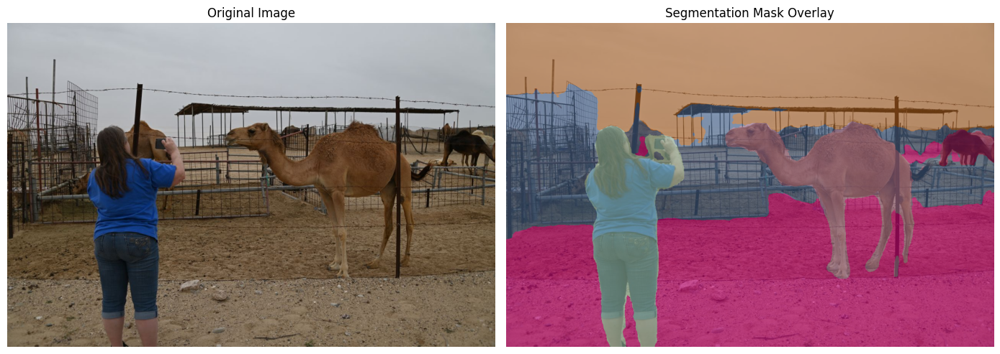

Picture: auto_rigshaws.jpg


Some weights of the model checkpoint at facebook/detr-resnet-50-panoptic were not used when initializing DetrForSegmentation: ['detr.model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cpu


roof: 0.925
chair: 0.925
car: 0.994
door-stuff: 0.915
car: 0.971
LABEL_194: 0.988
person: 0.957
LABEL_184: 0.995
car: 0.956
LABEL_193: 0.931
truck: 0.984
person: 0.983
car: 0.976
car: 0.996


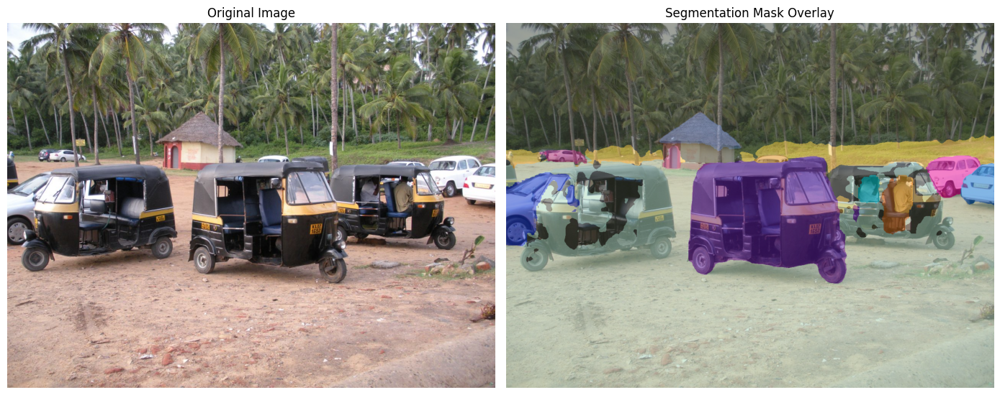

Picture: cargo_ship.jpg


Some weights of the model checkpoint at facebook/detr-resnet-50-panoptic were not used when initializing DetrForSegmentation: ['detr.model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cpu


LABEL_187: 1.000
boat: 0.998
sea: 0.999


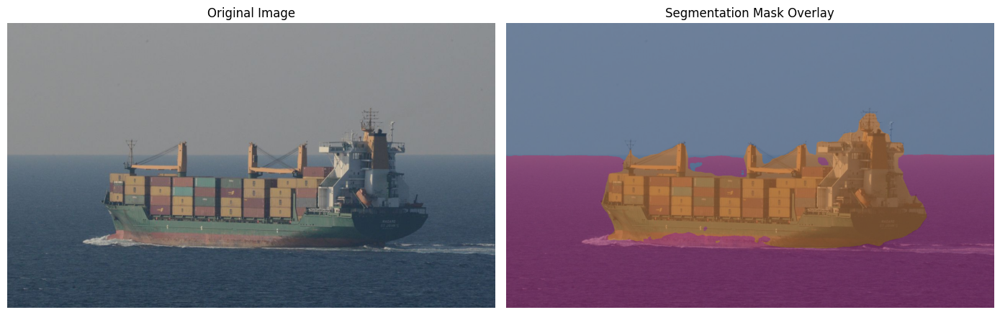

Picture: elephant.jpg


Some weights of the model checkpoint at facebook/detr-resnet-50-panoptic were not used when initializing DetrForSegmentation: ['detr.model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cpu


person: 0.999
person: 0.962
person: 0.974
road: 0.961
elephant: 0.966
car: 0.968
LABEL_187: 0.937
person: 0.996
LABEL_184: 0.996
LABEL_191: 0.901
elephant: 0.999
motorcycle: 0.965
person: 0.999
LABEL_194: 0.911
person: 0.990


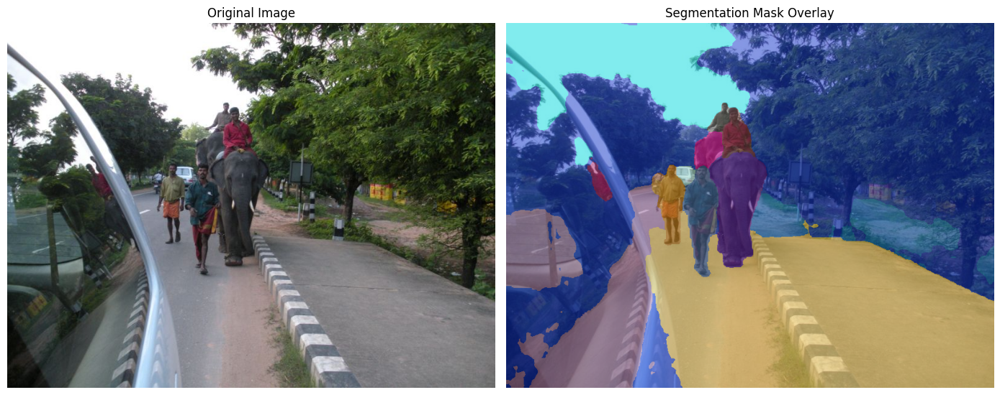

Picture: miami_beach.jpg


Some weights of the model checkpoint at facebook/detr-resnet-50-panoptic were not used when initializing DetrForSegmentation: ['detr.model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cpu


chair: 0.907
person: 0.993
person: 0.909
LABEL_184: 0.999
person: 0.945
person: 0.994
person: 0.923
LABEL_187: 0.996
person: 0.901
LABEL_197: 0.994
person: 0.919
road: 0.985
chair: 0.919
LABEL_191: 0.967
chair: 0.944
person: 0.950
person: 0.939
person: 0.988
person: 0.959
person: 0.908
dining table: 0.901
bicycle: 0.967


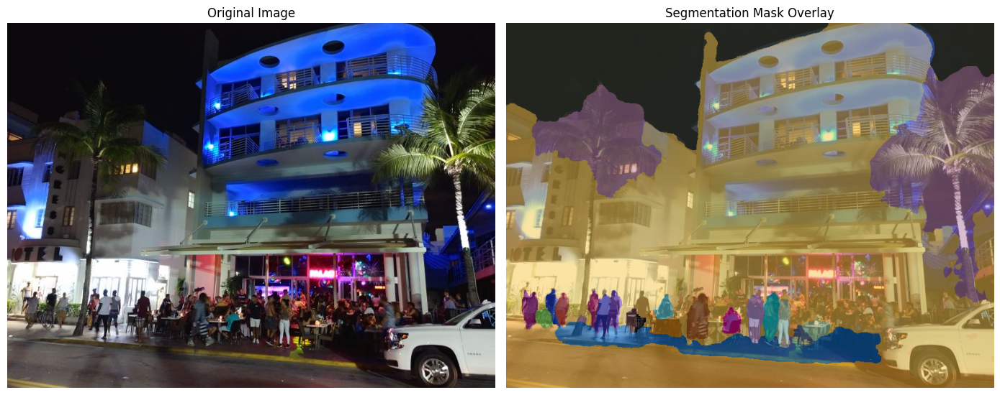

Picture: motorcycle.jpg


Some weights of the model checkpoint at facebook/detr-resnet-50-panoptic were not used when initializing DetrForSegmentation: ['detr.model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cpu


LABEL_193: 0.960
LABEL_192: 0.995
LABEL_187: 1.000
LABEL_192: 0.909
gravel: 0.997
road: 0.990
motorcycle: 0.999


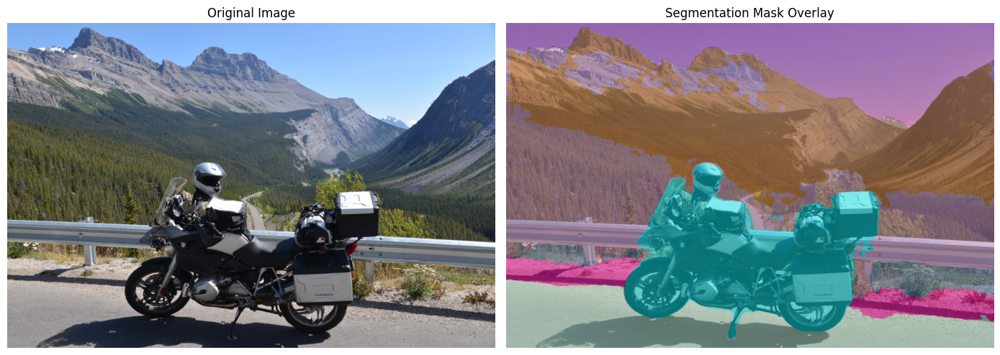

Picture: motorcycles.jpg


Some weights of the model checkpoint at facebook/detr-resnet-50-panoptic were not used when initializing DetrForSegmentation: ['detr.model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cpu


motorcycle: 1.000
LABEL_187: 1.000
LABEL_192: 0.999
motorcycle: 1.000


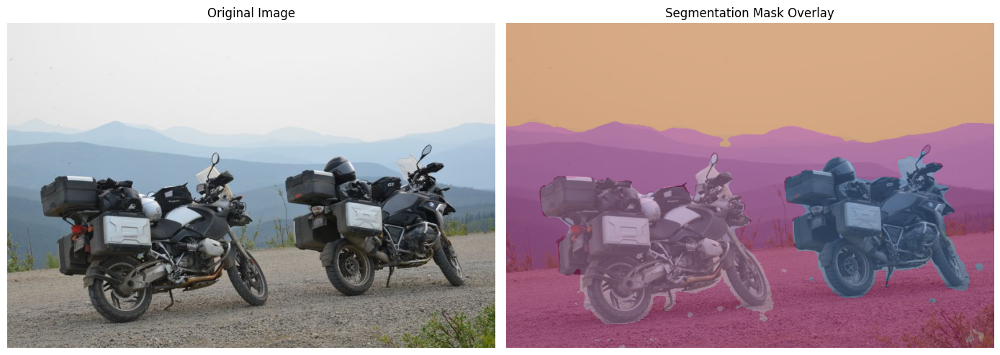

Picture: ships.jpg


Some weights of the model checkpoint at facebook/detr-resnet-50-panoptic were not used when initializing DetrForSegmentation: ['detr.model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cpu


boat: 0.995
LABEL_187: 1.000
LABEL_184: 0.982
boat: 0.967
boat: 0.995
sea: 0.968


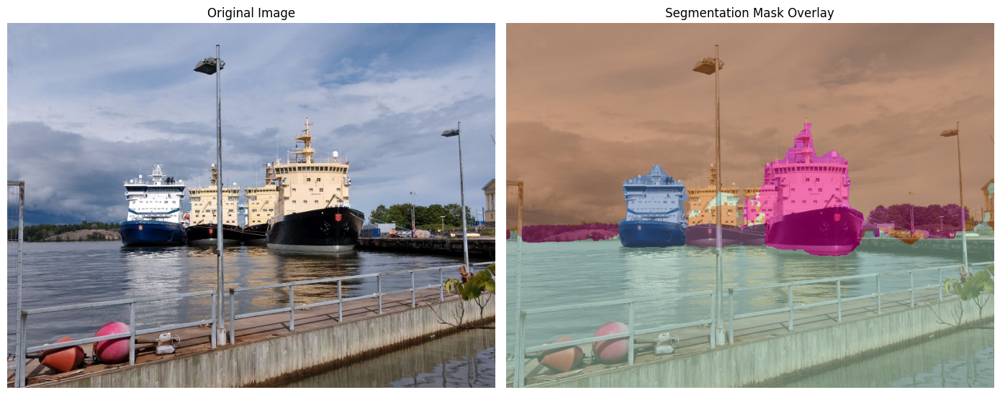

Picture: traffic.jpg


Some weights of the model checkpoint at facebook/detr-resnet-50-panoptic were not used when initializing DetrForSegmentation: ['detr.model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cpu


LABEL_197: 0.953
bus: 0.999
LABEL_187: 0.998
car: 0.904
LABEL_184: 0.992
motorcycle: 0.999
motorcycle: 0.985
road: 0.996
motorcycle: 0.999
person: 1.000
house: 0.918
person: 0.999
person: 0.989
car: 0.994
person: 0.962


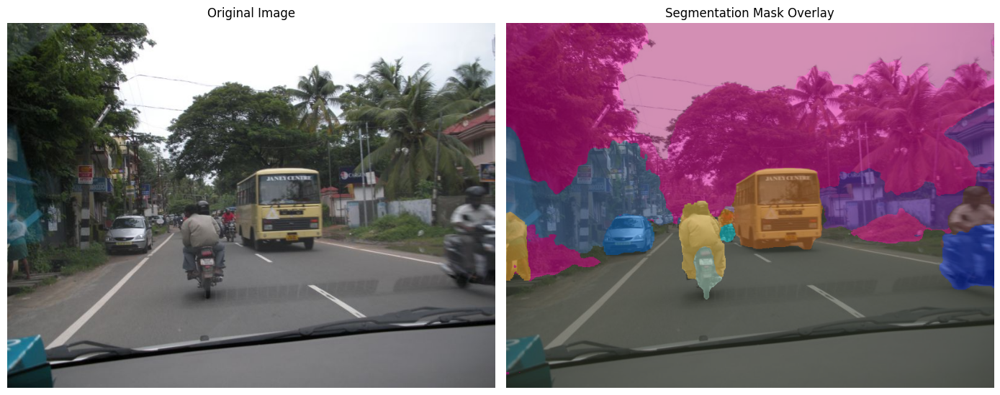

In [3]:
images_path = "images"

# Loop through all images in the directory
for filename in os.listdir(images_path):
    file_path = os.path.join(images_path, filename)

    # Only process image files
    if filename.lower().endswith((".jpg", ".jpeg", ".png", ".bmp")):
        print(f"Picture: {filename}")
        image = Image.open(file_path)

        segmenter = pipeline("image-segmentation", model="facebook/detr-resnet-50-panoptic")

        # Run segmentation
        segments = segmenter(image)

        # Print labels and scores
        for obj in segments:
            print(f"{obj['label']}: {obj['score']:.3f}")

        # Plot image and segmentation mask        
        plot_image_and_mask(image, segments) 
